In [1]:
import numpy as np
import pandas as pd
import scanpy as sc

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
from matplotlib import rcParams
import matplotlib.font_manager
rcParams['font.sans-serif']=['Arial']
sc.settings.set_figure_params(dpi=100, facecolor='white',fontsize=12)
import matplotlib.pyplot as plt
import seaborn as sns

scanpy==1.7.2 anndata==0.7.6 umap==0.4.6 numpy==1.22.4 scipy==1.6.2 pandas==1.5.2 scikit-learn==0.22 statsmodels==0.12.2 python-igraph==0.9.4


In [2]:
adata = sc.read('/home/data/hli/SHARE_analysis1/h5ad_file/20230529_RNA_446267cells_use.h5ad')

<ipython-input-6-625f1bf2fffc>:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['celltype_2023'].cat.reorder_categories(['JGA', 'POD', 'PEC', 'PT', 'PT_dediff', 'PT_VCAM1', 'tL1','tL2','tL-TAL',


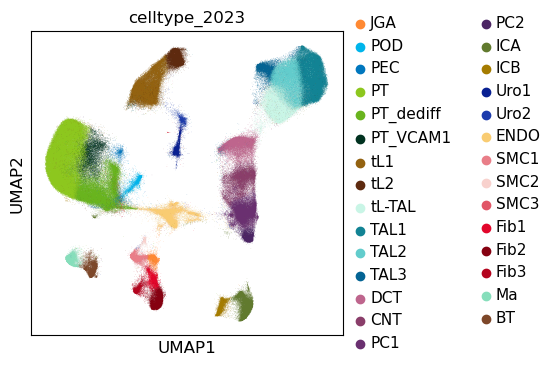

In [6]:
adata.obs['celltype_2023'].cat.reorder_categories(['JGA', 'POD', 'PEC', 'PT', 'PT_dediff', 'PT_VCAM1', 'tL1','tL2','tL-TAL',
                                                   'TAL1','TAL2', 'TAL3', 'DCT', 'CNT', 'PC1', 'PC2', 'ICA', 'ICB', 
       'Uro1', 'Uro2', 'ENDO', 'SMC1', 'SMC2', 'SMC3',
       'Fib1', 'Fib2', 'Fib3', 'Ma', 'BT'], inplace=True)
adata.uns['celltype_2023_colors']=['#FF8933', '#00B5EB', '#0077BE', '#8DC71E', '#69B41E', '#013220',
        '#936210', '#5E2A0F', '#C9F5E6','#128394', '#62CCCC', '#046494',
       '#be658d', '#8a3e6a', '#6a3070', '#4c2564', '#617A2E', '#A57C00',
       '#092092', '#1C3BAC', '#F9CC72', '#E97E88', '#F8D1CD', '#E15566',
       '#E2062B', '#860111', '#B4041E', '#86DEBB', '#7D4729']
sc.pl.umap(adata, color=['celltype_2023'])

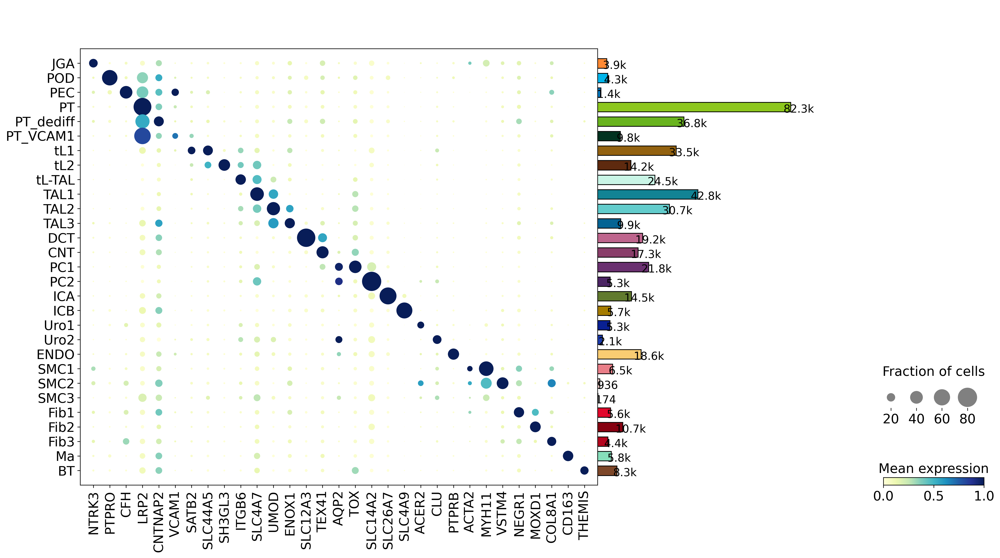

In [11]:
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=20)
marker_genes=[ 'NTRK3','PTPRO','CFH',
              'LRP2','CNTNAP2','VCAM1',
              'SATB2','SLC44A5','SH3GL3','ITGB6',
              'SLC4A7','UMOD','ENOX1',
              'SLC12A3','TEX41','AQP2','TOX','SLC14A2',
              'SLC26A7','SLC4A9',
              'ACER2','CLU',
              'PTPRB','ACTA2','MYH11','VSTM4',
              'NEGR1','MOXD1','COL8A1',
              'CD163','THEMIS'
    ]

colors_dp=adata.uns['celltype_2023_colors']

sc.pl.DotPlot(adata, marker_genes, groupby='celltype_2023',
             standard_scale='var',expression_cutoff=0.75)\
.add_totals(color=colors_dp,size=6)\
.style(cmap="YlGnBu",largest_dot=600,dot_edge_lw=0,size_exponent=1.2)\
.legend(width=3,colorbar_title='Mean expression',size_title='Fraction of cells\n').show()

In [13]:
adata.obs['celltype_2023'].value_counts()

PT           82341
TAL1         42803
PT_dediff    36802
tL1          33518
TAL2         30662
tL-TAL       24464
PC1          21757
DCT          19226
ENDO         18592
CNT          17255
ICA          14483
tL2          14203
Fib2         10749
TAL3          9887
PT_VCAM1      9766
BT            8275
SMC1          6464
Ma            5836
ICB           5654
Fib1          5556
PC2           5346
Uro1          5329
Fib3          4428
POD           4321
JGA           3939
Uro2          2063
PEC           1438
SMC2           936
SMC3           174
Name: celltype_2023, dtype: int64

In [19]:
cell_order=['JGA','POD','PEC',
'PT','PT_dediff','PT_VCAM1',
'tL1','tL2','tL-TAL',
'TAL1','TAL2','TAL3',
'DCT','CNT','PC1','PC2',
'ICA','ICB',
'Uro1','Uro2',
'ENDO','SMC1','SMC2','SMC3',
'Fib1','Fib2','Fib3',
'Ma','BT']

sample_name=sorted(list(set(adata.obs['renal_region_new'])))

dict2=pd.value_counts(adata.obs['renal_region_new'])

output=open('celltype_2023_ratio_in_5regions.csv','w')
output.write('sample,')
for i in cell_order:
    if i == 'BT':
        output.write(str(i)+'%')
    else:
        output.write(str(i)+'%,')
output.write('\n')
for i in sample_name:
    sampletype=adata.obs[adata.obs['renal_region_new']==str(i)]
    celldict=pd.value_counts(sampletype['celltype_2023'])
    output.write(str(i)+',')
    totaln=int(dict2[i])
    for aaa in cell_order:
        if aaa == 'BT':
            output.write(str(float(celldict[aaa])/totaln))
        else:
            output.write(str(float(celldict[aaa])/totaln)+',')
    output.write('\n')
file=pd.read_csv('celltype_2023_ratio_in_5regions.csv', delimiter = ',',index_col=False)
file

,sample,JGA%,POD%,PEC%,PT%,PT_dediff%,PT_VCAM1%,tL1%,tL2%,tL-TAL%,...,Uro2%,ENDO%,SMC1%,SMC2%,SMC3%,Fib1%,Fib2%,Fib3%,Ma%,BT%
0,C,0.007238,0.016431,0.005409,0.321758,0.144621,0.036139,0.017408,0.006490,0.020573,...,0.001064,0.029359,0.008522,0.000381,0.000242,0.013218,0.006637,0.006110,0.013767,0.023738
1,M,0.006867,0.002786,0.001093,0.060853,0.015930,0.009388,0.162804,0.017984,0.139408,...,0.008163,0.047286,0.003368,0.000450,0.000476,0.012192,0.008807,0.001393,0.006074,0.004937
2,P,0.009718,0.000373,0.000469,0.009080,0.008070,0.003632,0.127882,0.125657,0.042214,...,0.008828,0.063466,0.007541,0.000613,0.000433,0.007745,0.094183,0.017607,0.010752,0.008130
3,RA,0.075112,0.015292,0.002849,0.016942,0.067616,0.003448,0.027886,0.016192,0.029985,...,0.003148,0.130585,0.172264,0.045577,0.000750,0.040630,0.023688,0.023088,0.040180,0.016042
4,U,0.015077,0.006133,0.000426,0.013288,0.036286,0.001533,0.017462,0.009029,0.015503,...,0.011584,0.024702,0.198893,0.037649,0.001959,0.017121,0.019250,0.105537,0.068228,0.122828


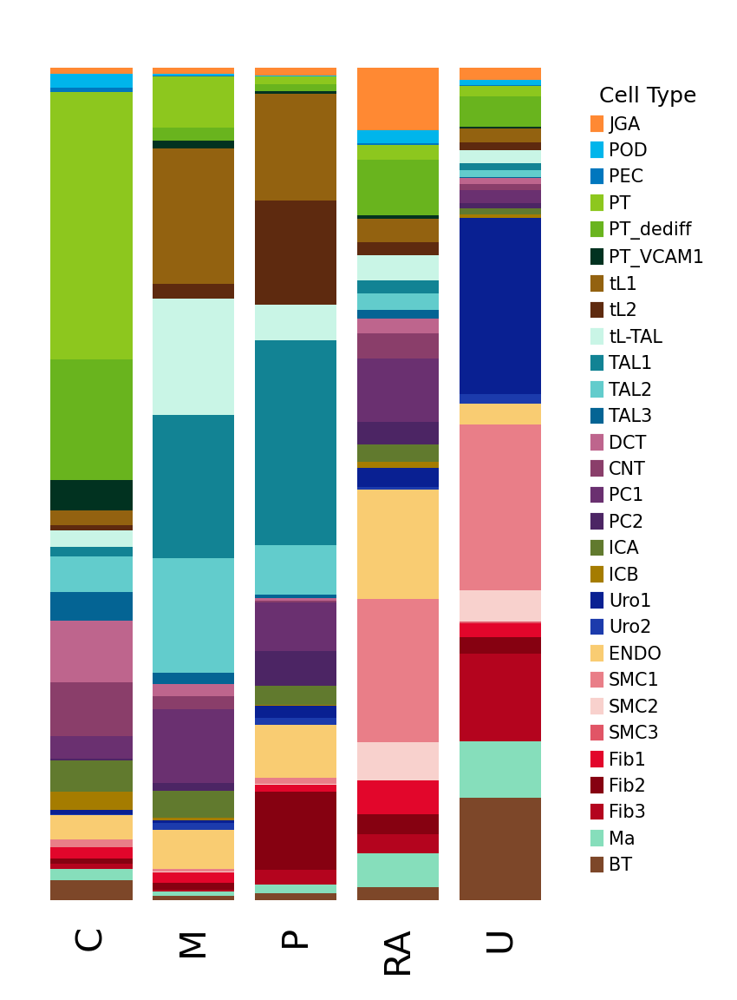

In [20]:
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=12)
dict1={}
for i in range(len(cell_order)):
    dict1[cell_order[i]]=np.array(file.iloc[:,[i+1]].iloc[:,0])
dynamics=np.repeat(1,5)

dict2={}
for i in dict1.keys():
    dynamics=dynamics-dict1[i]
    dict2[i]=dynamics
color_dict={}
for i in cell_order:
    ind=cell_order.index(i)
    color_dict[i]=adata.uns['celltype_2023_colors'][ind]

import matplotlib.pyplot as plt 
plt.figure(dpi = 300, figsize=(3,4))
width =0.8
for i in range(len(cell_order)):
    celltype=cell_order[i]
    plt.bar(sample_name, dict1[celltype], width, bottom=dict2[celltype], color=color_dict[celltype])


plt.grid(False)
plt.xticks(rotation=90,fontsize=10)
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    labelbottom=True) # labels along the bottom edge are off
plt.tick_params(
    axis='y',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    left=False,         # ticks along the top edge are off
labelleft=False)
#plt.ylabel('Cell Type Proportion')
for spine in plt.gca().spines.values():
    spine.set_visible(False)
    
labels = list(color_dict.keys())
handles = [plt.Rectangle((0,0),1,1, color=color_dict[label]) for label in labels]
plt.legend(handles, labels, bbox_to_anchor=(1.02, 0.95),fontsize=5,frameon=False,title='Cell Type',title_fontsize=6)

plt.tight_layout()
#plt.savefig('figures/cell_ratio_dynamic_new_sample_corrected.png')
plt.show()

In [23]:
cell_order=['C','M','P','RA','U']

sample_name=['JGA','POD','PEC',
'PT','PT_dediff','PT_VCAM1',
'tL1','tL2','tL-TAL',
'TAL1','TAL2','TAL3',
'DCT','CNT','PC1','PC2',
'ICA','ICB',
'Uro1','Uro2',
'ENDO','SMC1','SMC2','SMC3',
'Fib1','Fib2','Fib3',
'Ma','BT']

dict2=pd.value_counts(adata.obs['celltype_2023'])

output=open('renalregion_ratio_in_celltype_2023.csv','w')
output.write('sample,')
for i in cell_order:
    if i == 'U':
        output.write(str(i)+'%')
    else:
        output.write(str(i)+'%,')
output.write('\n')
for i in sample_name:
    sampletype=adata.obs[adata.obs['celltype_2023']==str(i)]
    celldict=pd.value_counts(sampletype['renal_region_new'])
    output.write(str(i)+',')
    totaln=int(dict2[i])
    for aaa in cell_order:
        if aaa == 'U':
            output.write(str(float(celldict[aaa])/totaln))
        else:
            output.write(str(float(celldict[aaa])/totaln)+',')
    output.write('\n')
file=pd.read_csv('renalregion_ratio_in_celltype_2023.csv', delimiter = ',',index_col=False)
file

,sample,C%,M%,P%,RA%,U%
0,JGA,0.424981,0.197766,0.205128,0.127190,0.044935
1,POD,0.879426,0.073131,0.007174,0.023606,0.016663
2,PEC,0.869958,0.086231,0.027121,0.013213,0.003477
3,PT,0.903730,0.083834,0.009169,0.001372,0.001895
4,PT_dediff,0.908836,0.049101,0.018233,0.012255,0.011575
5,PT_VCAM1,0.855826,0.109052,0.030924,0.002355,0.001843
6,tL1,0.120115,0.550988,0.317233,0.005549,0.006116
7,tL2,0.105682,0.143632,0.735619,0.007604,0.007463
8,tL-TAL,0.194490,0.646419,0.143476,0.008175,0.007440
9,TAL1,0.060323,0.456113,0.478845,0.002523,0.002196


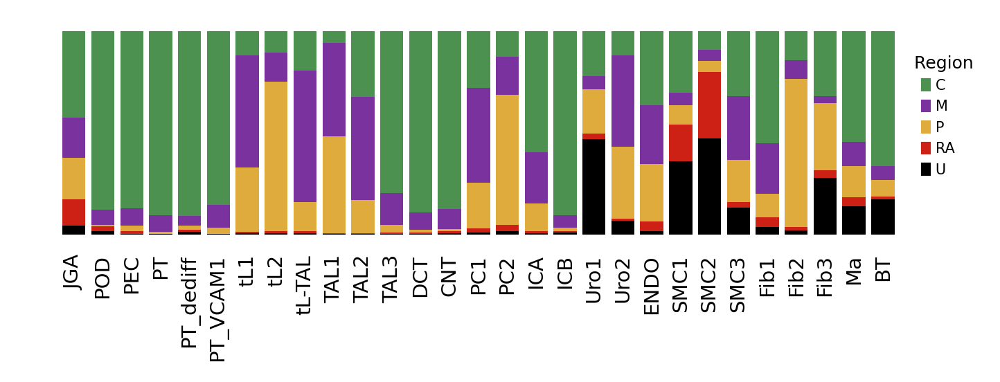

In [25]:
sc.settings.set_figure_params(dpi=100, facecolor='white',fontsize=12)
dict1={}
for i in range(len(cell_order)):
    dict1[cell_order[i]]=np.array(file.iloc[:,[i+1]].iloc[:,0])
dynamics=np.repeat(1,29)

dict2={}
for i in dict1.keys():
    dynamics=dynamics-dict1[i]
    dict2[i]=dynamics
color_dict={}
for i in cell_order:
    ind=cell_order.index(i)
    color_dict[i]=adata.uns['renal_region_new_colors'][ind]

import matplotlib.pyplot as plt 
plt.figure(dpi = 300, figsize=(5,2))
width =0.8
for i in range(len(cell_order)):
    celltype=cell_order[i]
    plt.bar(sample_name, dict1[celltype], width, bottom=dict2[celltype], color=color_dict[celltype])


plt.grid(False)
plt.xticks(rotation=90,fontsize=7)
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    labelbottom=True) # labels along the bottom edge are off
plt.tick_params(
    axis='y',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    left=False,         # ticks along the top edge are off
labelleft=False)
#plt.ylabel('Cell Type Proportion')
for spine in plt.gca().spines.values():
    spine.set_visible(False)
    
labels = list(color_dict.keys())
handles = [plt.Rectangle((0,0),1,1, color=color_dict[label]) for label in labels]
plt.legend(handles, labels, bbox_to_anchor=(0.95, 0.9),fontsize=5,frameon=False,title='  Region',title_fontsize=6)

plt.tight_layout()
#plt.savefig('figures/cell_ratio_dynamic_new_sample_corrected.png')
plt.show()

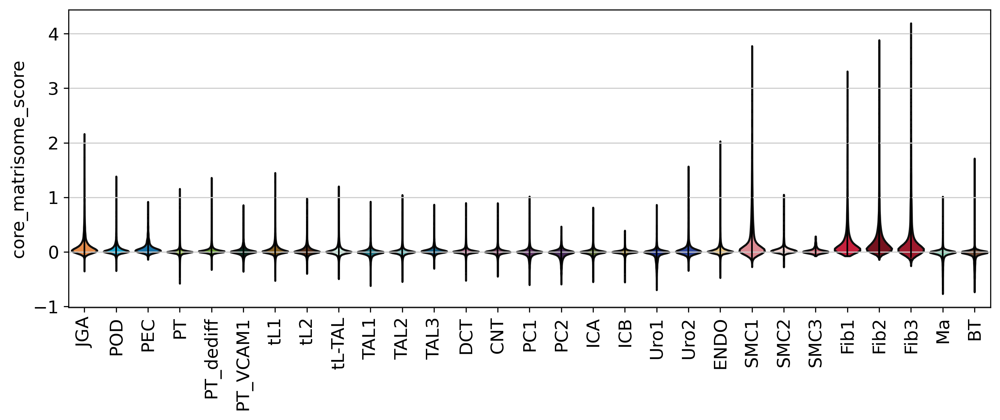

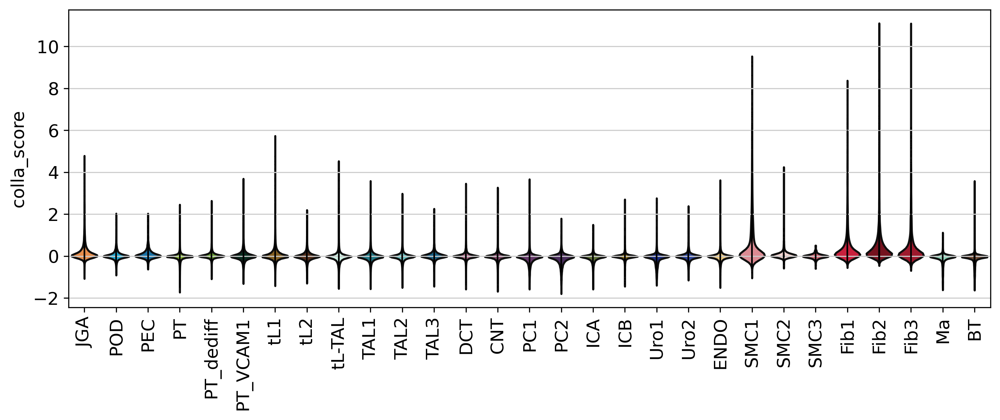

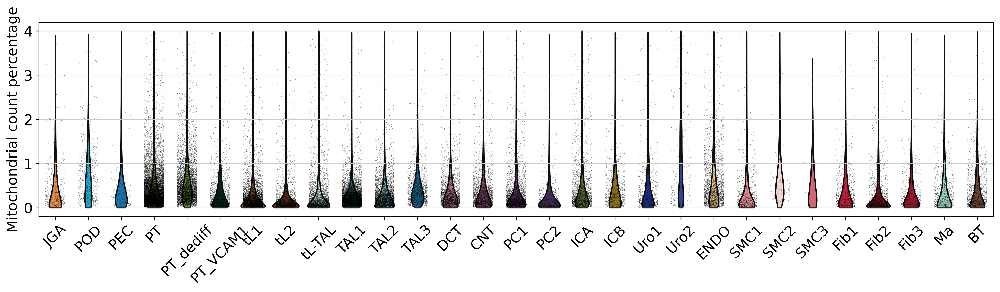

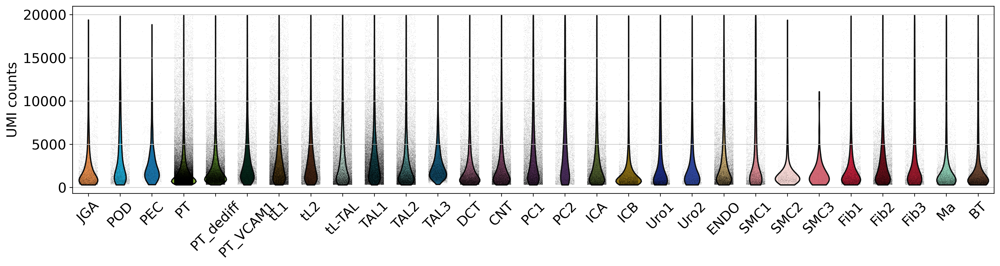

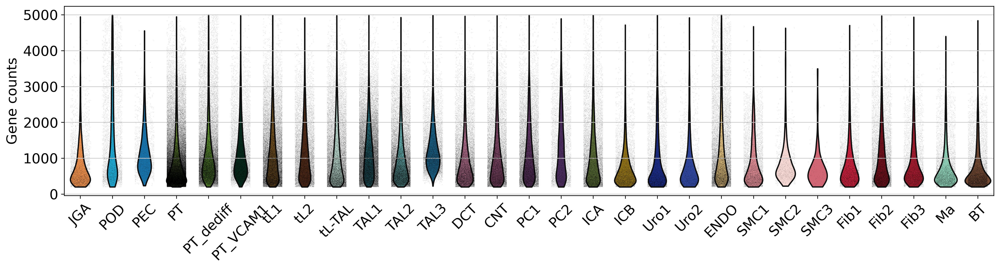

In [26]:
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=13)
plt.rcParams["figure.figsize"] = (10,4)
sc.pl.violin(adata, ['core_matrisome_score'], groupby='celltype_2023',rotation=90,scale='width',jitter=False)
sc.pl.violin(adata, ['colla_score'], groupby='celltype_2023',rotation=90,scale='width',jitter=False)

sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=16)
rcParams['figure.figsize'] = 15,4
sc.pl.violin(adata,  'pct_counts_mt',groupby='celltype_2023', jitter=0.3, size=0.2,rotation=45,
             ylabel='Mitochondrial count percentage',scale='area',palette=adata.uns['celltype_2023_colors'])
sc.pl.violin(adata,  'n_counts',groupby='celltype_2023', jitter=0.3, size=0.2,rotation=45,
             ylabel='UMI counts',scale='area',palette=adata.uns['celltype_2023_colors'])
sc.pl.violin(adata,  'n_genes',groupby='celltype_2023', jitter=0.3, size=0.2,rotation=45,
             ylabel='Gene counts',scale='area',palette=adata.uns['celltype_2023_colors'])

In [27]:
df = pd.read_csv('celltype_2023_ratio_in_5regions.csv',index_col=0)
df

,JGA%,POD%,PEC%,PT%,PT_dediff%,PT_VCAM1%,tL1%,tL2%,tL-TAL%,TAL1%,...,Uro2%,ENDO%,SMC1%,SMC2%,SMC3%,Fib1%,Fib2%,Fib3%,Ma%,BT%
sample,,,,,,,,,,,,,,,,,,,,,
C,0.007238,0.016431,0.005409,0.321758,0.144621,0.036139,0.017408,0.006490,0.020573,0.011164,...,0.001064,0.029359,0.008522,0.000381,0.000242,0.013218,0.006637,0.006110,0.013767,0.023738
M,0.006867,0.002786,0.001093,0.060853,0.015930,0.009388,0.162804,0.017984,0.139408,0.172104,...,0.008163,0.047286,0.003368,0.000450,0.000476,0.012192,0.008807,0.001393,0.006074,0.004937
P,0.009718,0.000373,0.000469,0.009080,0.008070,0.003632,0.127882,0.125657,0.042214,0.246503,...,0.008828,0.063466,0.007541,0.000613,0.000433,0.007745,0.094183,0.017607,0.010752,0.008130
RA,0.075112,0.015292,0.002849,0.016942,0.067616,0.003448,0.027886,0.016192,0.029985,0.016192,...,0.003148,0.130585,0.172264,0.045577,0.000750,0.040630,0.023688,0.023088,0.040180,0.016042
U,0.015077,0.006133,0.000426,0.013288,0.036286,0.001533,0.017462,0.009029,0.015503,0.008007,...,0.011584,0.024702,0.198893,0.037649,0.001959,0.017121,0.019250,0.105537,0.068228,0.122828


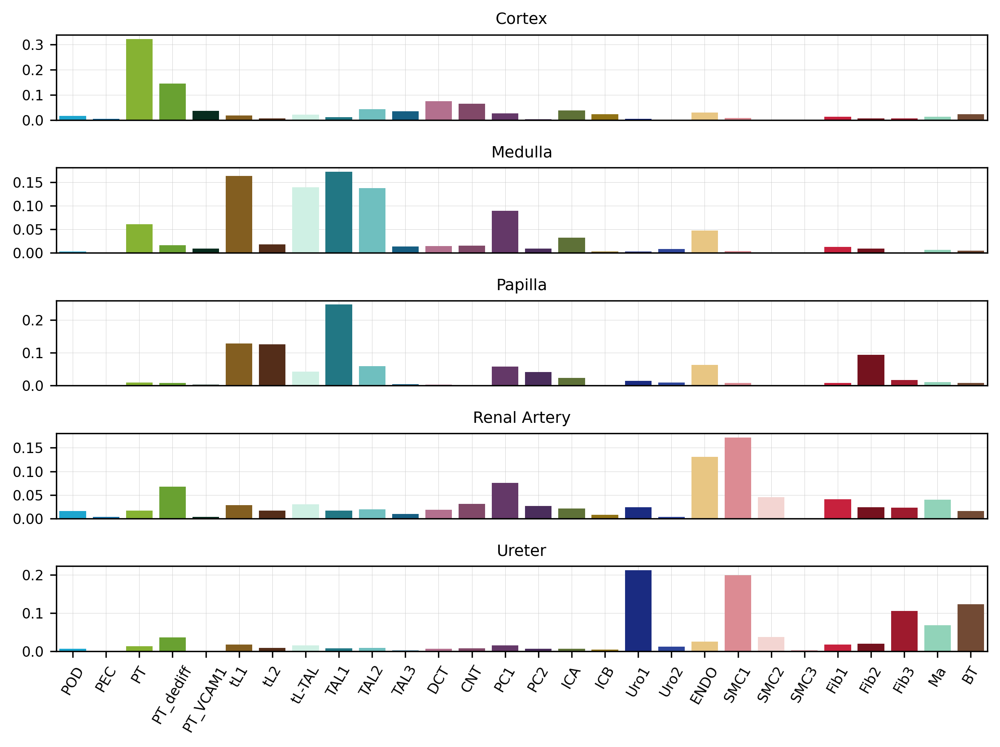

In [31]:
celltype_cmap2=['#00B5EB', '#0077BE', '#8DC71E', '#69B41E', '#013220',
        '#936210', '#5E2A0F', '#C9F5E6','#128394', '#62CCCC', '#046494',
       '#be658d', '#8a3e6a', '#6a3070', '#4c2564', '#617A2E', '#A57C00',
       '#092092', '#1C3BAC', '#F9CC72', '#E97E88', '#F8D1CD', '#E15566',
       '#E2062B', '#860111', '#B4041E', '#86DEBB', '#7D4729']

rcParams['figure.figsize'] = 8,6
ax1 = plt.subplot(511)
sns.barplot(
            x=xlabels[1:],
            y=list(df.loc[df.index[0]])[1:],
           palette=celltype_cmap2)
plt.yticks(np.arange(0, max(list(df.loc[df.index[0]])[1:]), 0.1),fontsize=8)
plt.title('Cortex',fontsize=9); plt.grid(True,linewidth=0.2)
plt.tick_params('x',labelbottom=False,color='w')
ax1.set_axisbelow(True)

ax2 = plt.subplot(512, sharex=ax1)
sns.barplot(
            x=xlabels[1:],
            y=list(df.loc[df.index[1]])[1:],
           palette=celltype_cmap2)
plt.yticks(np.arange(0, max(list(df.loc[df.index[1]])[1:]), 0.05),fontsize=8)
plt.title('Medulla',fontsize=9); plt.grid(True,linewidth=0.2)
plt.tick_params('x',labelbottom=False,color='w')
ax2.set_axisbelow(True)

ax3 = plt.subplot(513, sharex=ax1)
sns.barplot(
            x=xlabels[1:],
            y=list(df.loc[df.index[2]])[1:],
           palette=celltype_cmap2)
plt.yticks(np.arange(0, max(list(df.loc[df.index[2]])[1:]), 0.1),fontsize=8)
plt.title('Papilla',fontsize=9); plt.grid(True,linewidth=0.2)
plt.tick_params('x',labelbottom=False,color='w')
ax3.set_axisbelow(True)

ax4 = plt.subplot(514, sharex=ax1)
sns.barplot(
            x=xlabels[1:],
            y=list(df.loc[df.index[3]])[1:],
           palette=celltype_cmap2)
plt.yticks(np.arange(0, max(list(df.loc[df.index[3]])[1:]), 0.05),fontsize=8)
plt.title('Renal Artery',fontsize=9); plt.grid(True,linewidth=0.2)
plt.tick_params('x',labelbottom=False,color='w')
ax4.set_axisbelow(True)

# share x only
ax5 = plt.subplot(515, sharex=ax1)
sns.barplot(
            x=xlabels[1:],
            y=list(df.loc[df.index[4]])[1:],
           palette=celltype_cmap2)
plt.yticks(np.arange(0, max(list(df.loc[df.index[4]])[1:]), 0.1),fontsize=8)
plt.title('Ureter',fontsize=9); plt.grid(True,linewidth=0.2)
plt.xticks(fontsize=8,rotation=60)
ax5.set_axisbelow(True)

plt.tight_layout()
plt.show()

In [44]:
#top 100 tL-TAL markers
input_mtx=pd.read_excel('/home/data/hli/SHARE_RNA_analysis2/metabolism_gene_set/rat_tubule/rat_tubule_RNA_seq.xlsx',index_col=0)
marker_genes=['KCNIP4','SPP1','ERBB4','MALAT1','PLCB1','ENSG00000226994','EFNA5','ADAMTS1','PRKD1','ITGB6','DNAH5','ENSG00000232153','PDE1A','CACNA2D3','MECOM','ARHGAP6','ESRRG','KAZN','HIF1A','SAT1','LINC02532','IVNS1ABP','TPST1','PPP2R3A','TENM4','SGIP1','ARHGEF38','SOD2','DEPTOR','LINC01320','GGT3P','PLEKHA1','BICC1','SLC12A1','GGT2','OSMR','PROM1','SASH1','LINC01606','IMMP2L','CASR','NRP1','ADAMTS9-AS2','SAMD4A','FAM135A','NCOA7','SPTLC3','CDC42SE2','PHACTR1','SLC4A7','CLDN10','ASIC2','OXR1','PTPRG','NEAT1','ATP1A1','NAMPT','OSBPL3','MSI2','MAST4','CYP24A1','VMP1','ARHGAP24','CCSER1','CFAP221','TRIO','NOS1AP','PKHD1','MKLN1','SGMS1','ABLIM1','IGFBP7','CPD','MEGF11','MFHAS1','BMP6','RALGAPA2','NLGN4Y','MIRLET7IHG','PAX8-AS1','PTPN14','SEC14L1','RNF144B','NCOA2','PITPNC1','MYO9A','RBPMS','FNDC3B','CLMN','HIVEP2','ARID5B','DCDC2','STAT3','BICDL1','LINC00472','ACSL4','NFKBIZ','PRKCE','FOXP2','KLHL2','SLC49A4'
             ]
print(len(marker_genes))
marker_genes_new=[]
marker_genes_human_common={}
for i in marker_genes:
    new_gene=i[0]+i[1:].lower()
    if new_gene in input_mtx.index:
        marker_genes_new.append(new_gene)
        marker_genes_human_common[new_gene]=i
marker_genes_new.append('Dirc2')#slc49a4 in rat
marker_genes_human_common['Dirc2']='SLC49A4'
print(len(marker_genes_new))

101
67


In [46]:
from  matplotlib.colors import LinearSegmentedColormap
traffic=LinearSegmentedColormap.from_list('name',["limegreen", "w", "red"], N=256)

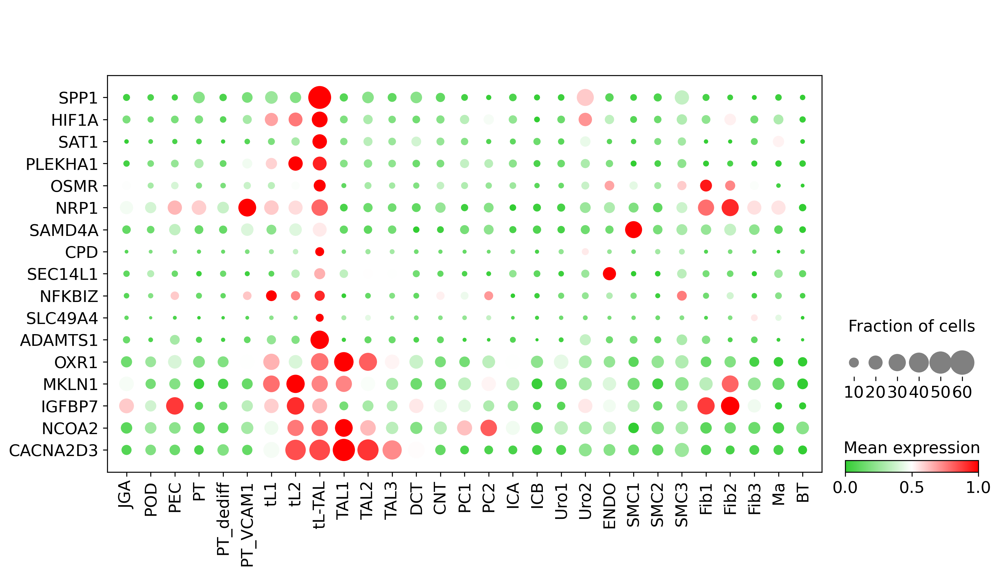

In [49]:
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=16)
marker_genes_new=[
 'Spp1',
 'Hif1a',
 'Sat1',
 'Plekha1',
 'Osmr',
 'Nrp1',
 'Samd4a',
 'Cpd',
 'Sec14l1',
 'Nfkbiz',
 'Dirc2', 'Adamts1', 'Oxr1',
 'Mkln1',
 'Igfbp7', 'Ncoa2', 'Cacna2d3']
dtl_marker=[]
for i in marker_genes_new:
    dtl_marker.append(marker_genes_human_common[i])
sc.pl.DotPlot(adata, dtl_marker, groupby='celltype_2023',
             standard_scale='var',expression_cutoff=0.85)\
.style(cmap=traffic,largest_dot=400,dot_edge_lw=0,size_exponent=1)\
.legend(width=2,colorbar_title='Mean expression',size_title='Fraction of cells\n').swap_axes().show()

In [50]:
#now check tL markers
marker_genes=['PKHD1','PFKFB3','RBPMS','NFAT5','BICC1','IMMP2L','PAX8-AS1','THSD7A','COBLL1','KAZN','ADAMTS9-AS2','ARHGAP29','PROM1','NEBL','SLCO3A1','DAPK1','LINC02532','LINC00472','ZBTB20','MECOM','FOXP2','AFF1','PAX8','PTPN14','UTRN','GRIP1','PTBP3','GLS','SLC44A5','NTN4','MYO9A','LRRK2','SLC38A1','SRGAP3','PAX2','PTPN13','ENSG00000236283','MAPK10','ADAM10','FRY','GLIS3','SNHG14','SCIN','ERMP1','WWC1','KCNJ3','SLC14A2','COL4A5','EGFR','VAV3','NLGN1','MACC1','MAGI1','PARD3B','GRHL2','PPFIBP1','ITGB8','DSCAML1','SCCPDH','SYTL2','TPM1','C11orf80','TMTC2','AIF1L','RNF144B','EHF','FER','LHFPL3','MKLN1','WDFY3','PAPPA','SAMD12','FRAS1','STOX2','BMPR1B','MIR99AHG','FNDC3B','ARHGEF35-AS1','SETBP1','ENSG00000285876','HIF1A','MARCHF1','MAML3','LINC02649','ALDH1A2','IGFBP7','FTX','SASH1','CD200','MAML2','PDE4D','MIR31HG','HNF1B','OPHN1','BICD1','DISP1','CCDC198','SMAD3','FTO','KSR2'
             ]
print(len(marker_genes))
marker_genes_new=[]
marker_genes_human_common={}
for i in marker_genes:
    new_gene=i[0]+i[1:].lower()
    if new_gene in input_mtx.index:
        marker_genes_new.append(new_gene)
        marker_genes_human_common[new_gene]=i
print(len(marker_genes_new))

100
72


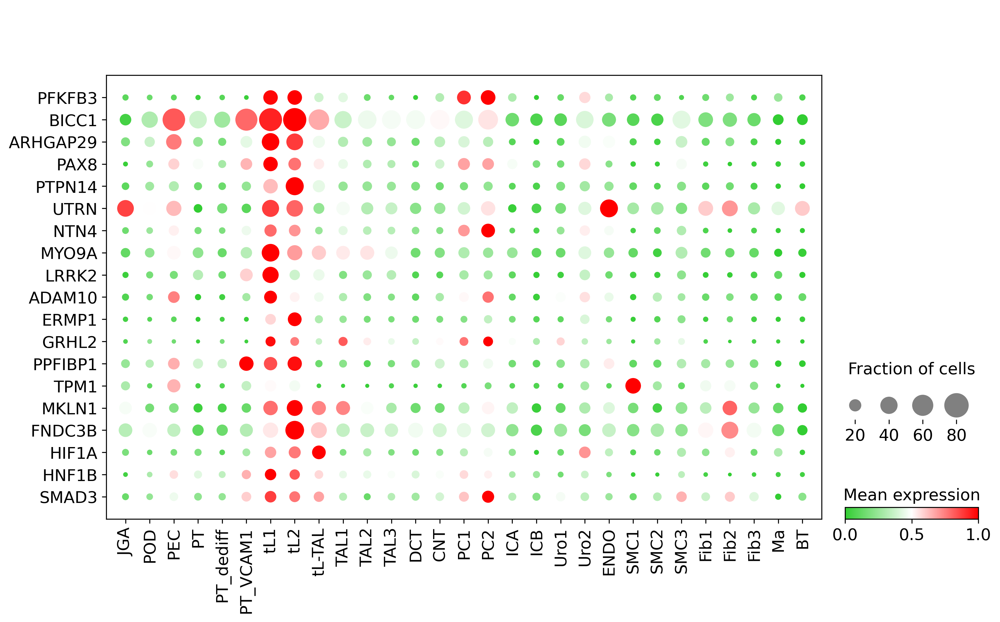

In [51]:
marker_genes_new=['Pfkfb3',
 'Bicc1',
 'Arhgap29',
 'Pax8',
 'Ptpn14',
 'Utrn',
 'Ntn4',
 'Myo9a',
 'Lrrk2',
 'Adam10',
 'Ermp1',
 'Grhl2',
 'Ppfibp1',
 'Tpm1',
 'Mkln1',
 'Fndc3b',
 'Hif1a',
 'Hnf1b',
 'Smad3']
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=16)

dtl_marker=[]
for i in marker_genes_new:
    dtl_marker.append(marker_genes_human_common[i])
sc.pl.DotPlot(adata, dtl_marker, groupby='celltype_2023',
             standard_scale='var',expression_cutoff=0.85)\
.style(cmap=traffic,largest_dot=400,dot_edge_lw=0,size_exponent=1)\
.legend(width=2,colorbar_title='Mean expression',size_title='Fraction of cells\n').swap_axes().show()

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_celltype_2023']`


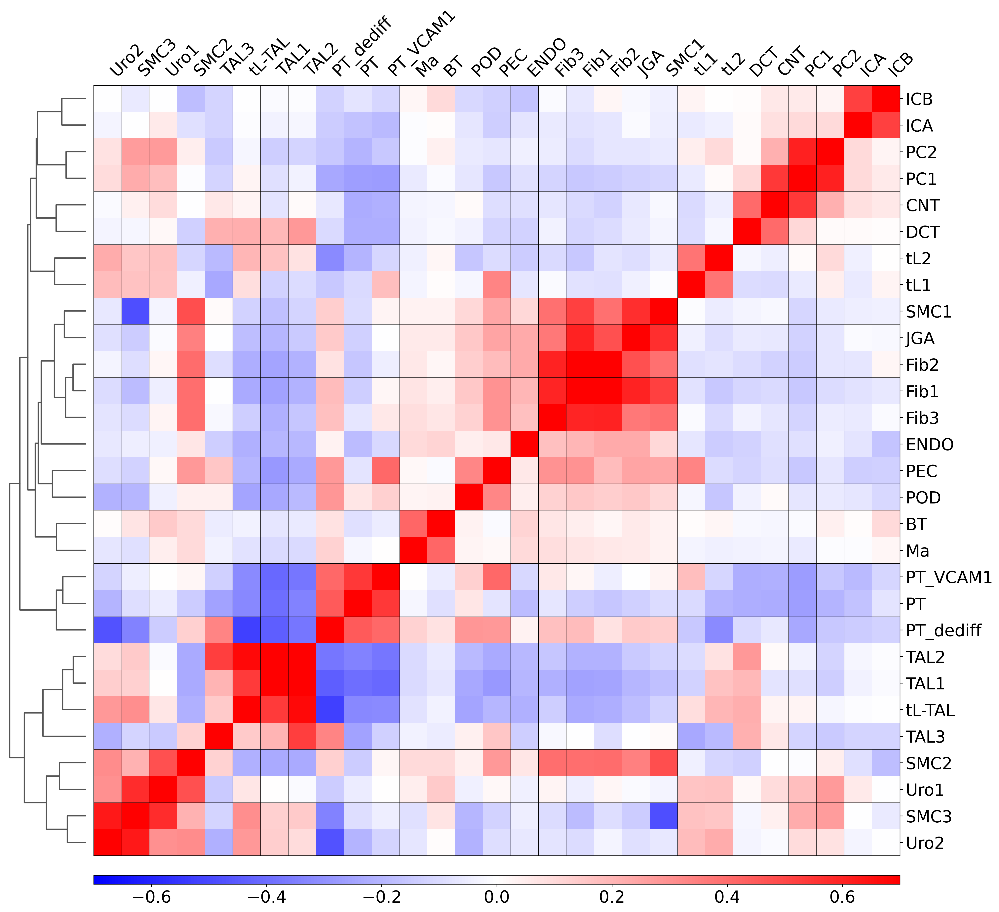

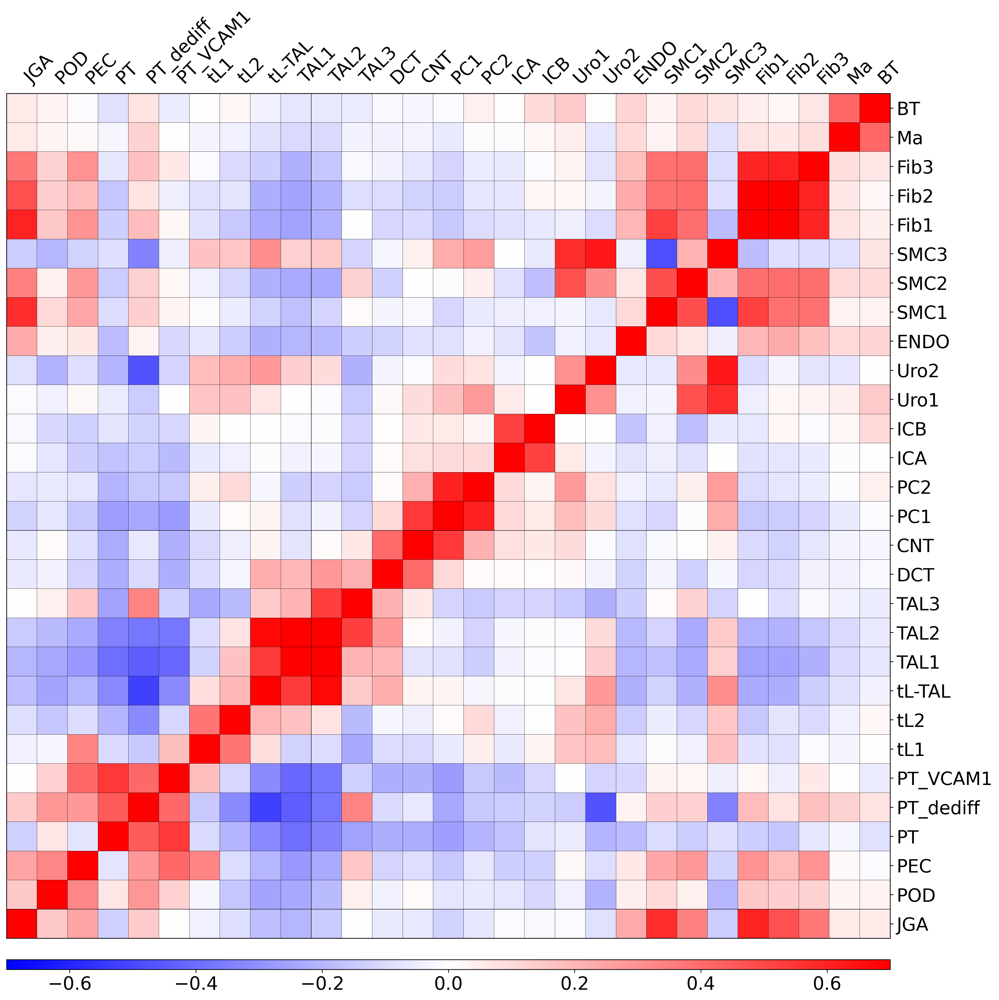

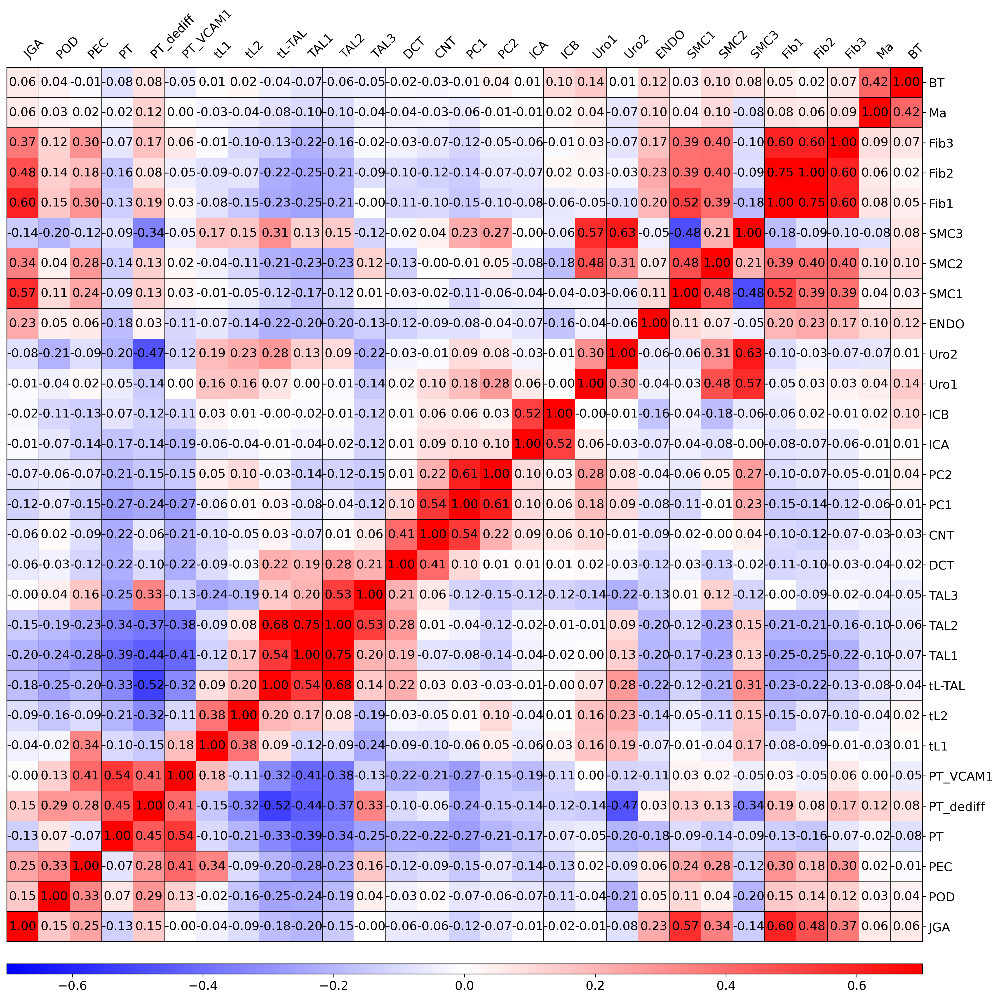

In [54]:
#read the raw file
adata2=sc.read('RNA_446267cells_raw.h5ad')
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=20)
sc.pl.correlation_matrix(adata2, groupby='celltype_2023',dendrogram=True,vmax=0.7,vmin=-0.7)
sc.pl.correlation_matrix(adata2, groupby='celltype_2023',dendrogram=False,vmax=0.7,vmin=-0.7)
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=13)
sc.pl.correlation_matrix(adata2, groupby='celltype_2023',dendrogram=False,show_correlation_numbers=True,vmax=0.7,vmin=-0.7)

In [6]:
cell_order=['POD','PEC',
'PT','PT_dediff','PT_VCAM1',
'tL1','tL2','tL-TAL',
'TAL1','TAL2','TAL3',
'DCT','CNT','PC1','PC2',
'ICA','ICB',
'Uro1','Uro2',
'ENDO','SMC1','SMC2','SMC3',
'Fib1','Fib2','Fib3',
'Ma','BT']

sample_name=['AFBY380_C', 'AGAK419_C', 'AGFY330_C1', 'AGFY330_C2', 'AHBL363_C', 'AHBQ224_C', 'AHLD054_C',
 'AICO097_C', 'AID4428_C', 'AIEB037_C1', 'AIEB037_C2', 'AIEL007_C', 'AIEU059_C',
  'BMC21673_C','BMC34582_C', 'BMC48768_C', 'BMC54678_C','BxT0DCD14_C', 'BxT0DCD9_C', 'BxT0LD2_C', 'BxT0LD3_C', 'BxT0LD5_C', 'BxT1LD2_C', 'BxT1LD5_C',

 'AFBY380_M1','AFBY380_M2', 'AGAK419_M',  'AHBQ224_M', 'AID4428_M', 'AIEL007_M', 'AIEU059_M', 'AICO097_M','AHBL363_M','BxT0LD4_M',

 'AGFY330_P', 'AHBL363_P', 'AIEB037_P', 'AGAK419_P', 'AIEL007_P', 'AICO097_P','AID4428_P',

 'AFBY380_RA', 'AFCD398_RA', 'AGFY330_RA',
'AGAK419_U','AFCD398_U','AGFY330_U', 'AFBY380_U']

dict2=pd.value_counts(adata.obs['patient_region_id_new'])

output=open('celltype_2023_ratio_in_48samples.csv','w')
output.write('sample,')
for i in cell_order:
    if i == 'BT':
        output.write(str(i)+'%')
    else:
        output.write(str(i)+'%,')
output.write('\n')
for i in sample_name:
    sampletype=adata.obs[adata.obs['patient_region_id_new']==str(i)]
    celldict=pd.value_counts(sampletype['celltype_2023'])
    output.write(str(i)+',')
    totaln=int(dict2[i])
    for aaa in cell_order:
        if aaa == 'BT':
            output.write(str(float(celldict[aaa])/totaln))
        else:
            output.write(str(float(celldict[aaa])/totaln)+',')
    output.write('\n')
file=pd.read_csv('celltype_2023_ratio_in_48samples.csv', delimiter = ',',index_col=False)

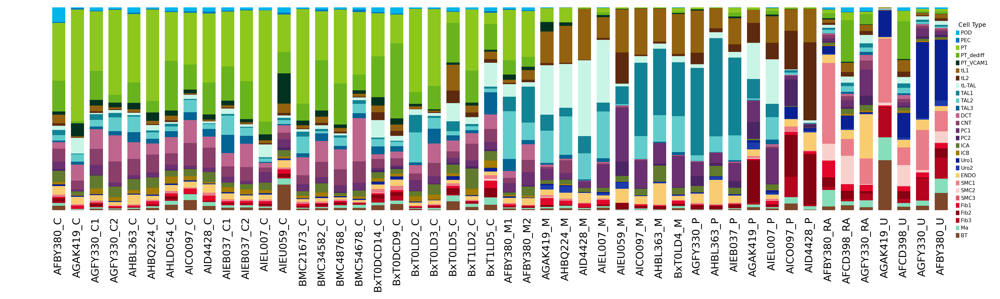

In [7]:
dict1={}
for i in range(len(cell_order)):
    dict1[cell_order[i]]=np.array(file.iloc[:,[i+1]].iloc[:,0])
dynamics=np.repeat(1,48)

dict2={}
for i in dict1.keys():
    dynamics=dynamics-dict1[i]
    dict2[i]=dynamics
color_dict={}
for i in cell_order:
    ind=cell_order.index(i)
    color_dict[i]=adata.uns['celltype_2023_colors'][ind]

import matplotlib.pyplot as plt 
plt.figure(dpi = 300, figsize=(14,4))
width =0.7
for i in range(len(cell_order)):
    celltype=cell_order[i]
    plt.bar(sample_name, dict1[celltype], width, bottom=dict2[celltype], color=color_dict[celltype])


plt.grid(False)
plt.xticks(rotation=90,fontsize=10)
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    labelbottom=True) # labels along the bottom edge are off
plt.tick_params(
    axis='y',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    left=False,         # ticks along the top edge are off
labelleft=False)
#plt.ylabel('Cell Type Proportion')
for spine in plt.gca().spines.values():
    spine.set_visible(False)
    
labels = list(color_dict.keys())
handles = [plt.Rectangle((0,0),1,1, color=color_dict[label]) for label in labels]
plt.legend(handles, labels, bbox_to_anchor=(1, 0.95),fontsize=5,frameon=False,title='Cell Type',title_fontsize=6)

plt.tight_layout()
#plt.savefig('figures/cell_ratio_dynamic_new_sample_corrected.png')
plt.show()

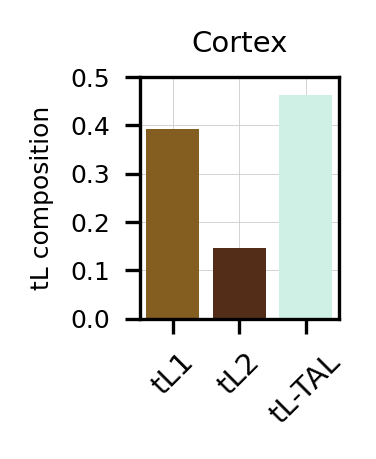

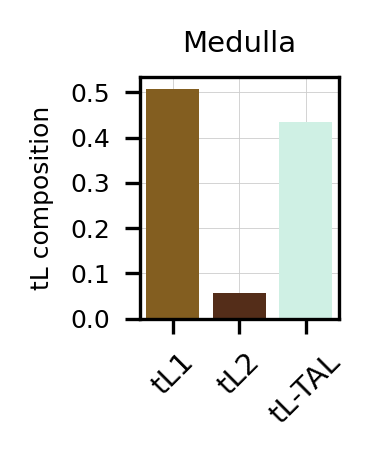

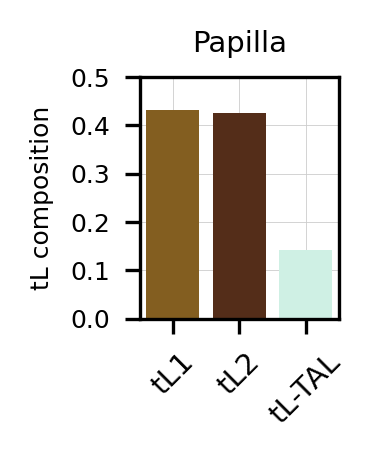

In [8]:
#plot how many tL1/2 and tL-TAL in c/m/p
sum_cal=4758+4026+1501
sc.settings.set_figure_params(dpi=300, facecolor='white',fontsize=9)
import seaborn as sns
import matplotlib.pyplot as plt
rcParams['figure.figsize'] = 1.3,1.6
ax=sns.barplot(
            x=['tL1','tL2','tL-TAL'],
            y=[4026/sum_cal, 1501/sum_cal,4758/sum_cal],
           palette=['#936210', '#5E2A0F','#C9F5E6']
)
#plt.grid(axis ='x', color = 'grey', linestyle = '--', linewidth = 0.5)
plt.grid(True,linewidth=0.2)
plt.ylabel('tL composition',fontsize=6);plt.title('Cortex',fontsize=7)
plt.yticks(np.arange(0, max(4758/sum_cal, 4026/sum_cal, 1501/sum_cal)+0.1, 0.1),fontsize=6)
plt.xticks(fontsize=7, rotation=45)
ax.set_axisbelow(True)
plt.tight_layout()
plt.show()

sum_cal=15814+18468+2040
rcParams['figure.figsize'] = 1.3,1.6
ax=sns.barplot(
            x=['tL1','tL2','tL-TAL'],
            y=[18468/sum_cal, 2040/sum_cal,15814/sum_cal],
           palette=['#936210', '#5E2A0F','#C9F5E6']
)
#plt.grid(axis ='x', color = 'grey', linestyle = '--', linewidth = 0.5)
plt.grid(True,linewidth=0.2)
plt.ylabel('tL composition',fontsize=6);plt.title('Medulla',fontsize=7)
plt.yticks(np.arange(0, max(15814/sum_cal, 18468/sum_cal, 2040/sum_cal), 0.1),fontsize=6)
plt.xticks(fontsize=7, rotation=45);ax.set_axisbelow(True)
plt.tight_layout()
plt.show()

sum_cal=3510+10633+10448
rcParams['figure.figsize'] = 1.3,1.6
ax=sns.barplot(
            x=['tL1','tL2','tL-TAL'],
            y=[10633/sum_cal, 10448/sum_cal,3510/sum_cal],
           palette=['#936210', '#5E2A0F','#C9F5E6']
)
#plt.grid(axis ='x', color = 'grey', linestyle = '--', linewidth = 0.5)
plt.grid(True,linewidth=0.2)
plt.ylabel('tL composition',fontsize=6);plt.title('Papilla',fontsize=7)
plt.yticks(np.arange(0, max(3510/sum_cal, 10633/sum_cal, 10448/sum_cal)+0.1, 0.1),fontsize=6)
plt.xticks(fontsize=7, rotation=45);ax.set_axisbelow(True)
plt.tight_layout()
plt.show()